In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

## Opening the data set

In [3]:
path=r"C:\Users\sebastian sossa\Documents\coderHouse\trabajo_final\data.csv"
old = pd.read_csv(path)
df = old.drop(columns=['Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2', 'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1' ])
df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


## Looking for empty data, overview the data

In [4]:
df.isnull().sum()

CLIENTNUM                   0
Attrition_Flag              0
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

In [5]:
df.describe()

,CLIENTNUM,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
count,1.012700e+04,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000
mean,7.391776e+08,46.325960,2.346203,35.928409,3.812580,2.341167,2.455317,8631.953698,1162.814061,7469.139637,0.759941,4404.086304,64.858695,0.712222,0.274894
std,3.690378e+07,8.016814,1.298908,7.986416,1.554408,1.010622,1.106225,9088.776650,814.987335,9090.685324,0.219207,3397.129254,23.472570,0.238086,0.275691
min,7.080821e+08,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000
25%,7.130368e+08,41.000000,1.000000,31.000000,3.000000,2.000000,2.000000,2555.000000,359.000000,1324.500000,0.631000,2155.500000,45.000000,0.582000,0.023000
50%,7.179264e+08,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4549.000000,1276.000000,3474.000000,0.736000,3899.000000,67.000000,0.702000,0.176000
75%,7.731435e+08,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,11067.500000,1784.000000,9859.000000,0.859000,4741.000000,81.000000,0.818000,0.503000
max,8.283431e+08,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000,3.714000,0.999000


In [6]:
df['Marital_Status'].unique()

array(['Married', 'Single', 'Unknown', 'Divorced'], dtype=object)

In [7]:
df.dtypes

CLIENTNUM                     int64
Attrition_Flag               object
Customer_Age                  int64
Gender                       object
Dependent_count               int64
Education_Level              object
Marital_Status               object
Income_Category              object
Card_Category                object
Months_on_book                int64
Total_Relationship_Count      int64
Months_Inactive_12_mon        int64
Contacts_Count_12_mon         int64
Credit_Limit                float64
Total_Revolving_Bal           int64
Avg_Open_To_Buy             float64
Total_Amt_Chng_Q4_Q1        float64
Total_Trans_Amt               int64
Total_Trans_Ct                int64
Total_Ct_Chng_Q4_Q1         float64
Avg_Utilization_Ratio       float64
dtype: object

# EDA

([<matplotlib.patches.Wedge at 0x1bd25909990>,
 [Text(-0.5319254019667502, 0.9628371444551314, 'Attrition client'),
  Text(0.5319254019667501, -0.9628371444551314, 'Existing client')],
 [Text(-0.2901411283455001, 0.5251838969755261, '16.1 %'),
  Text(0.29014112834550004, -0.5251838969755261, '83.9 %')])

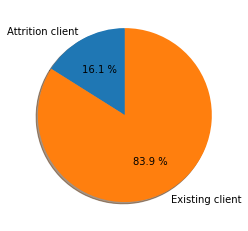

In [8]:
df.groupby('Attrition_Flag')['CLIENTNUM'].count()
attrition = (df[df['Attrition_Flag']=='Attrited Customer']['CLIENTNUM'].count()/df['CLIENTNUM'].count())*100
existing = (df[df['Attrition_Flag']=='Existing Customer']['CLIENTNUM'].count()/df['CLIENTNUM'].count())*100
data = [attrition, existing]
labeslsA = ['Attrition client', 'Existing client']
fig, ax = plt.subplots()
ax.pie(data, labels= labeslsA, startangle = 90, shadow=True, autopct="%0.1f %%")

Percentaje of attritioned customers and existing custumers 

### Atritioned and existing by gender

C:\Users\sebastian sossa\AppData\Local\Temp\ipykernel_5720\211841535.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  femenine_attrited = df.loc[df['Gender']=='F'][df['Attrition_Flag']== 'Attrited Customer'].count()
C:\Users\sebastian sossa\AppData\Local\Temp\ipykernel_5720\211841535.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  femenine_existing = df.loc[df['Gender']=='F'][df['Attrition_Flag']== 'Existing Customer'].count()
C:\Users\sebastian sossa\AppData\Local\Temp\ipykernel_5720\211841535.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  masculine_attrited = df.loc[df['Gender']=='M'][df['Attrition_Flag']== 'Attrited Customer'].count()
C:\Users\sebastian sossa\AppData\Local\Temp\ipykernel_5720\211841535.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  masculine_existing = df.loc[df['Gender']=='M'][df['Attrition_Flag']== 'Existing Customer'].co

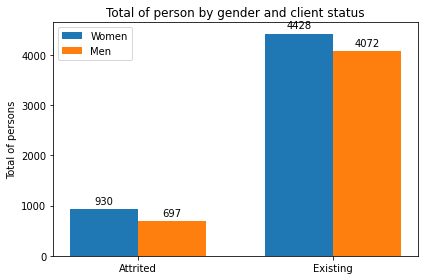

In [9]:
femenine_attrited = df.loc[df['Gender']=='F'][df['Attrition_Flag']== 'Attrited Customer'].count()
femenine_existing = df.loc[df['Gender']=='F'][df['Attrition_Flag']== 'Existing Customer'].count()

masculine_attrited = df.loc[df['Gender']=='M'][df['Attrition_Flag']== 'Attrited Customer'].count()
masculine_existing = df.loc[df['Gender']=='M'][df['Attrition_Flag']== 'Existing Customer'].count()


Femenine = [femenine_attrited['CLIENTNUM'], femenine_existing['CLIENTNUM'] ]
Masculine = [masculine_attrited['CLIENTNUM'], masculine_existing['CLIENTNUM']]

labels = ['Attrited', 'Existing']

x = np.arange(len(labels))  # the label locations

width = 0.35  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, Femenine, width, label='Women')
rects2 = ax.bar(x + width/2, Masculine, width, label='Men')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Total of persons')
ax.set_title('Total of person by gender and client status')
ax.set_xticks(x, labels)
ax.legend()

ax.bar_label(rects1, padding=3)
ax.bar_label(rects2, padding=3)

fig.tight_layout()

plt.show()

### marital status 

[709, 3978, 668, 3275, 129, 620, 121, 627]


C:\Users\sebastian sossa\AppData\Local\Temp\ipykernel_5720\910014065.py:11: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  principal_lis.append(df.loc[df['Marital_Status']== v][df['Attrition_Flag']== c].count()['CLIENTNUM'])


<AxesSubplot:>

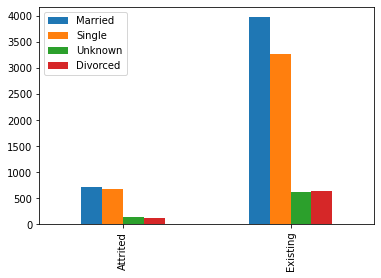

In [10]:
y_labels = ['Attrited Customer','Existing Customer' ]

x_labels =['Married', 'Single', 'Unknown', 'Divorced']


principal_lis = []


for v in x_labels:
    for c in y_labels:
        principal_lis.append(df.loc[df['Marital_Status']== v][df['Attrition_Flag']== c].count()['CLIENTNUM'])

attritioners = [principal_lis[0], principal_lis[2], principal_lis[4], principal_lis[6]]

existed = [principal_lis[1], principal_lis[3], principal_lis[5], principal_lis[7]]
print(principal_lis)



group_labels = ['Attrited', 'Existing']
groups = [attritioners, existed]

# Convert data to pandas DataFrame.
x_labels =['Married', 'Single', 'Unknown', 'Divorced']
df_plot= pd.DataFrame(groups, index=group_labels)
df_plot.rename(columns = {0:'Married', 1:'Single', 2:'Unknown', 3:'Divorced'}, inplace = True)
df_plot.plot.bar()


In [ ]:
y_labels = ['Attrited Customer','Existing Customer' ]

x_labels =['Married', 'Single', 'Unknown', 'Divorced']


principal_lis = []


for v in x_labels:
    for c in y_labels:
        principal_lis.append(df.loc[df['Marital_Status']== v][df['Attrition_Flag']== c].count()['CLIENTNUM'])

attritioners = [principal_lis[0], principal_lis[2], principal_lis[4], principal_lis[6]]

existed = [principal_lis[1], principal_lis[3], principal_lis[5], principal_lis[7]]
print(principal_lis)



group_labels = ['Attrited', 'Existing']
groups = [attritioners, existed]

# Convert data to pandas DataFrame.
x_labels =['Married', 'Single', 'Unknown', 'Divorced']
df_plot= pd.DataFrame(groups, index=group_labels)
df_plot.rename(columns = {0:'Married', 1:'Single', 2:'Unknown', 3:'Divorced'}, inplace = True)
df_plot.plot.bar()

Customer_Age


C:\Users\sebastian sossa\AppData\Local\Temp\ipykernel_5720\3509016897.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  ax[0] = sns.distplot(df[col], ax=ax[0])


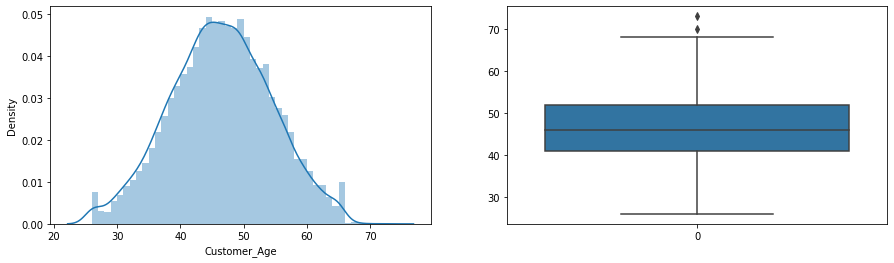

--------------------------------------------
Dependent_count


C:\Users\sebastian sossa\AppData\Local\Temp\ipykernel_5720\3509016897.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  ax[0] = sns.distplot(df[col], ax=ax[0])


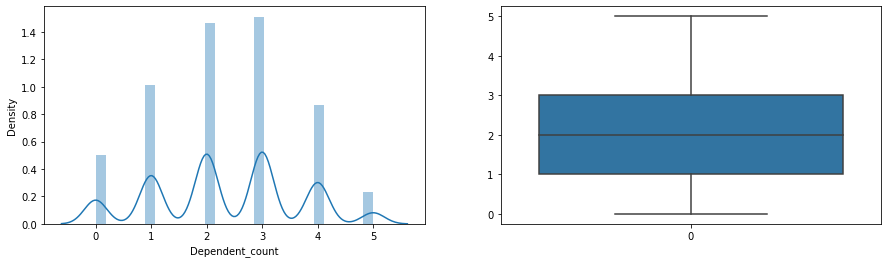

--------------------------------------------
Months_on_book


C:\Users\sebastian sossa\AppData\Local\Temp\ipykernel_5720\3509016897.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  ax[0] = sns.distplot(df[col], ax=ax[0])


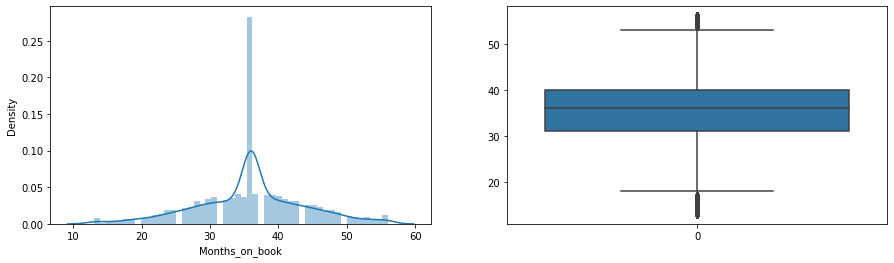

--------------------------------------------
Total_Relationship_Count


C:\Users\sebastian sossa\AppData\Local\Temp\ipykernel_5720\3509016897.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  ax[0] = sns.distplot(df[col], ax=ax[0])


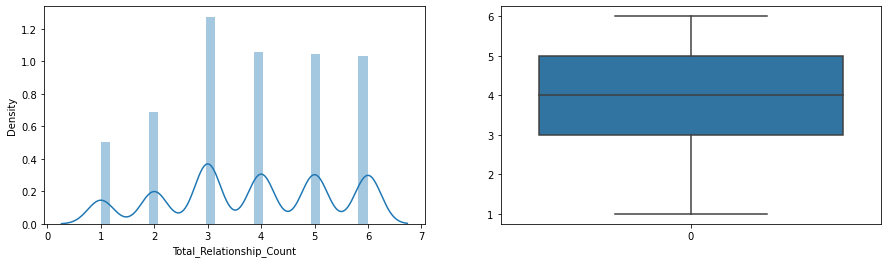

--------------------------------------------
Months_Inactive_12_mon


C:\Users\sebastian sossa\AppData\Local\Temp\ipykernel_5720\3509016897.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  ax[0] = sns.distplot(df[col], ax=ax[0])


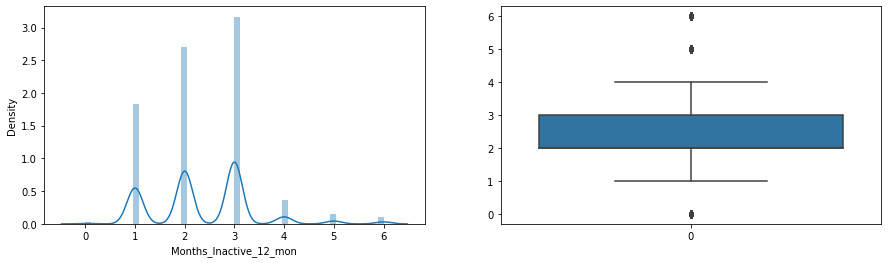

--------------------------------------------


In [11]:
for col in ['Customer_Age', 'Dependent_count', 'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon']:
  print(col)
  fig, ax = plt.subplots(1,2, figsize=(15, 4))
  ax[0] = sns.distplot(df[col], ax=ax[0])
  ax[1] = sns.boxplot(df[col], ax=ax[1])
  plt.show()
  print('--------------------------------------------')

In [13]:
from pandas_profiling import ProfileReport
profile = ProfileReport(df, title="Pandas Profiling Report")
profile

Render HTML: 100%|██████████| 1/1 [00:05<00:00,  5.89s/it]
